## ROI kinematics

Cut the data around each ROI and get the times in which they start decelerating and turning. 
Visualize as heatmaps over the arena and the distributions of positions/time differences.

In [159]:
include("settings.jl")

  Activating project at `~/Documents/Github/LocomotionControl`


### Visualize ROIs
Plot XY tracking data for bouts trimmed to each ROI to visualize their location in the arena.

In [2]:
out_bouts = convert(DataFrame, py"get_bouts('outbound')")
sample_bouts = out_bouts[1:100, :];


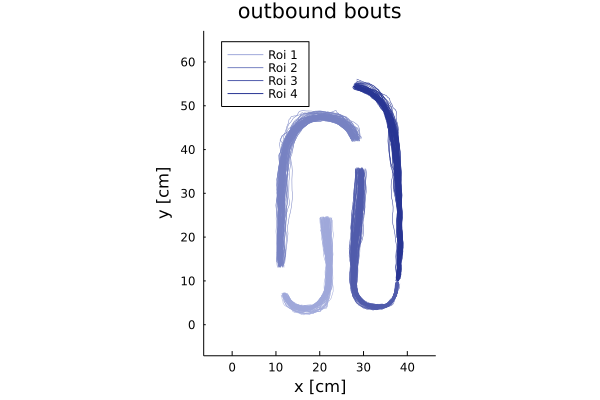

In [3]:
plt = plot(
    title="outbound bouts"; arena_ax_kwargs...
)

for roi in 1:4
    roi_bouts = get_roi_bouts(roi, sample_bouts)
    plot_bouts_trace!(plt, roi_bouts; color=roi_colors[roi], label="Roi $roi", legend=:topleft)
end

plt


### Heatmaps

Plot kinematics heatmaps for each ROI

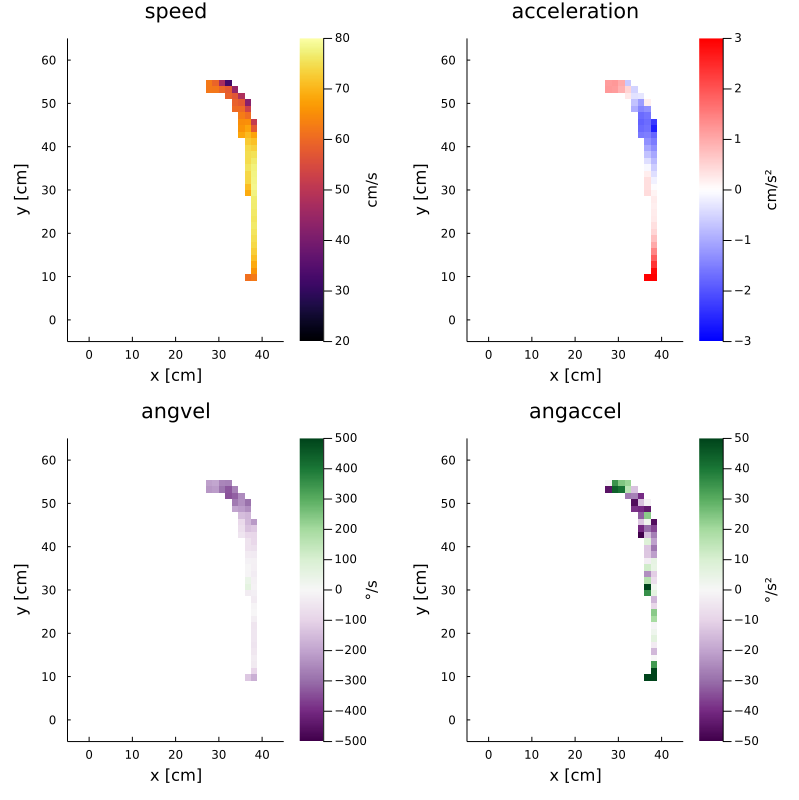

In [18]:
roi = 4
roi_bouts = get_roi_bouts(roi, sample_bouts)
s, X, Y, S, A, T, D = stack_kinematic_variables(roi_bouts)

plt = kinematics_heatmaps(X, Y, S, A, T, D;)
   

## Kinematics over s
Plot kinematics and mark ROIs over the s coordiante

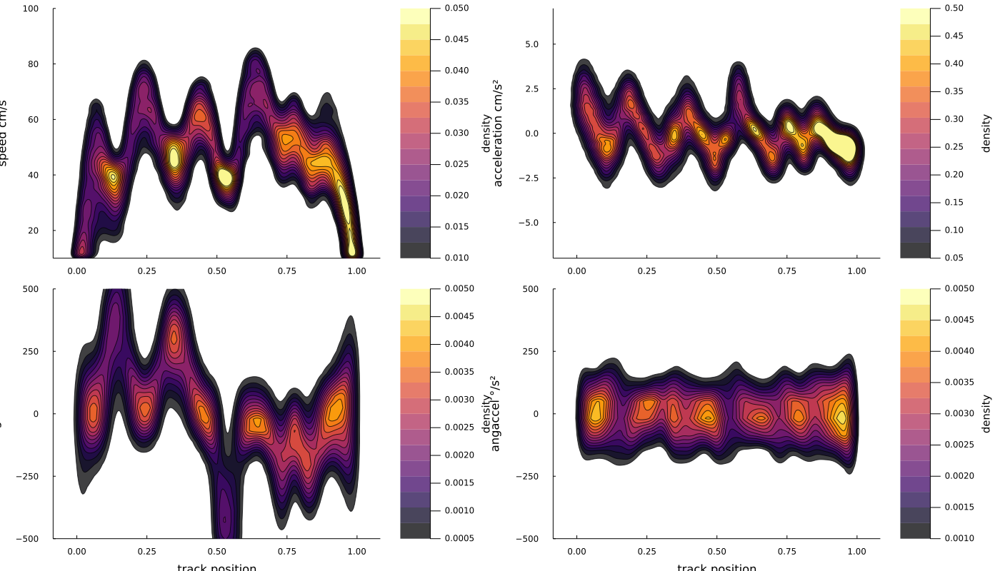

In [5]:
s, X, Y, S, A, T, D = stack_kinematic_variables(out_bouts)


p1 = plot(kde((s, S)), fill=(0, 0.75), clims=(0.01, 0.05), grid=false, colorbar_title="density", ylabel="speed cm/s", ylim=[10, 100])
p2 = plot(kde((s, A)), fill=(0, 0.75), clims=(0.05, 0.5), grid=false, colorbar_title="density", ylabel="acceleration cm/s²", ylim=[-7, 7])
p3 = plot(kde((s, T)), fill=(0, 0.75), clims=(0.0005, 0.005), grid=false, colorbar_title="density", ylabel="angvel °/s", ylim=[-500, 500], xlabel="track position")
p4 = plot(kde((s, D)), fill=(0, 0.75), clims=(0.001, 0.005), grid=false, colorbar_title="density", ylabel="angaccel °/s²", ylim=[-500, 500], xlabel="track position")

plot(
    p1, p2, p3, p4, layout=(2, 2), size=(1400, 800), legend=false
) |> display

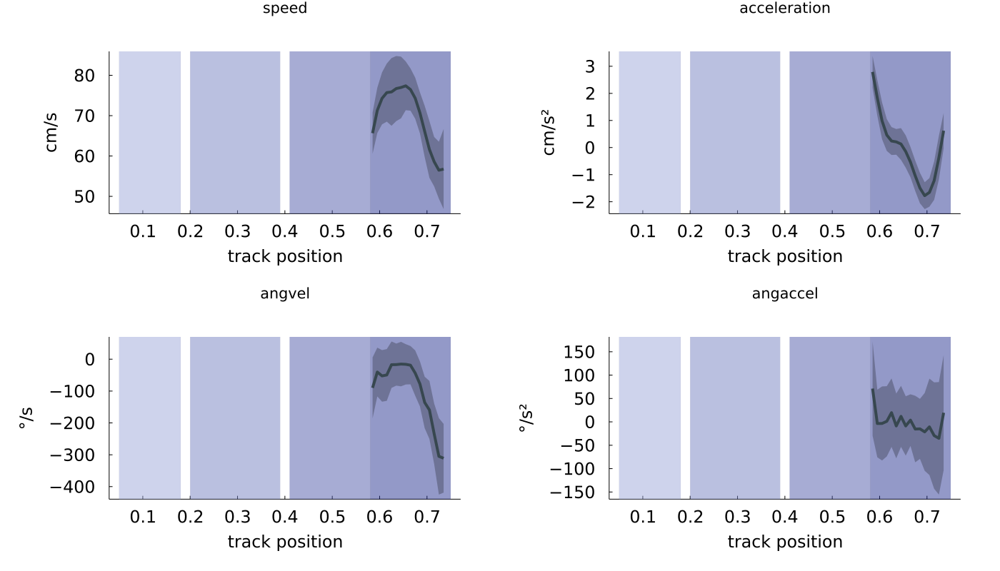

In [40]:
plots = []
for (name, var) in zip((:speed, :acceleration, :angvel, :angaccel), (S, A, T, D))
    x, μ, σ = bin_x_by_y(s, var, stepsize=0.01)
    c, l = variables_colors[name], variables_legends[name]

    plt = plot(xlabel="track position", ylabel=l, title=name)

    # mark ROIs locations
    for roi in 1:4
        vspan!(
            plt, [roi_limits[roi][1], roi_limits[roi][2]], 
            color=roi_colors[roi], alpha=0.5, label=nothing
        )
    end

    plot!(x, μ, ribbon=σ, color=blue_grey_darker,  label=nothing, lw=4, fill=(0, 0.25, :black))


    push!(plots, plt)
end

plot(plots..., layout=(2, 2), size=(1400, 800), legend=false; axes_kwargs..., axes_fontsize...)


## Slowing and Turning
For each trial detect when the mouse starts slowing down and when it starts turning at each ROIs. 

Make scatter plots of these positions over the arena. 
Make histograms of differences in kinematic variables at the two timepoints. 



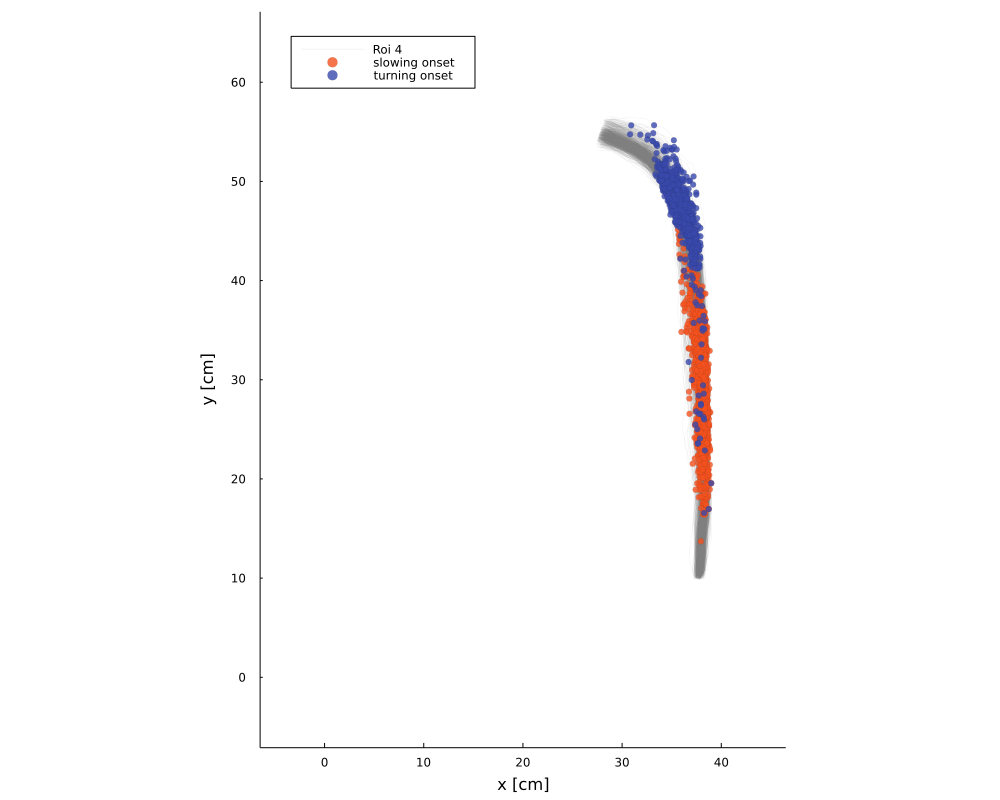

In [171]:
roi = 4
roi_bouts = get_roi_bouts(roi, out_bouts)

slow_kin, turn_kin = get_kinematics_at_slow_turn_onsets(roi_bouts)

plt = plot_bouts_trace(roi_bouts; color=:grey, label="Roi $roi", legend=:topleft, alpha=.1, size=(1000,800))
scatter!(slow_kin.x, slow_kin.y, color=salmon_dark, label="slowing onset", legend=:topleft, ms=4, msa=0, msw=0, alpha=.8)
scatter!(turn_kin.x, turn_kin.y, color=indigo_dark, label="turning onset", legend=:topleft, ms=4, msa=0, msw=0, alpha=.8)


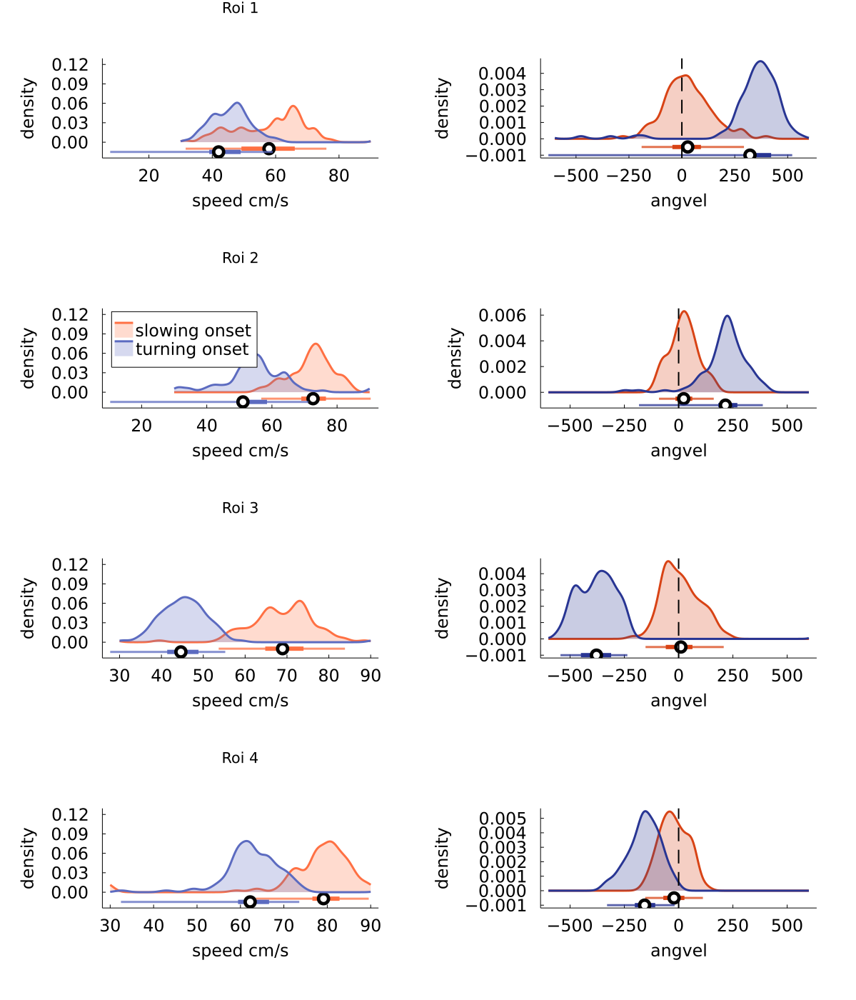

In [170]:
plots = []

for roi in 1:4
    roi_bouts = get_roi_bouts(roi, sample_bouts)
    slow_kin, turn_kin = get_kinematics_at_slow_turn_onsets(roi_bouts)
    
    plt = plot(title="Roi $roi", xlabel="speed cm/s", ylabel="density", ylim=[-0.02, 0.125], legend=roi == 2 ? :topleft : false)
    plot_density!(plt, slow_kin.speed; boundary=(30, 90), bandwidth=1.5, color=salmon, label="slowing onset", y=-0.01)
    plot_density!(plt, turn_kin.speed; boundary=(30, 90), bandwidth=1.5, color=indigo, label="turning onset", y=-0.015)

    plt2 = plot(xlabel="angvel", ylabel="density", legend=false)
    plot_density!(plt2, slow_kin.angvel; boundary=(-600, 600), bandwidth=25, color=salmon_darker, label="slowing onset", y=-0.0005)
    plot_density!(plt2, turn_kin.angvel; boundary=(-600, 600), bandwidth=25, color=indigo_darker, label="turning onset", y=-0.001)
    vline!(plt2, [0], color=:black, label=nothing, lw=2, ls=:dash)


    push!(plots, plt)
    push!(plots, plt2)
end

plot(plots..., layout=(4, 2), size=(1200, 1400); axes_kwargs..., axes_fontsize...)

Look at relationship between where/when they start slowing, how much they reduce their speed by...

In [172]:
function get_kinematics_at_slow_turn_onsets(bouts::DataFrame)
    timepoints = map(get_bout_slow_turn_onsets, eachrow(bouts))
    slowing_onsets, turning_onsets = first.(timepoints), last.(timepoints)

    # store kinematics at timepoints in named tuples
    kinos = (:s, :x, :y, :speed, :acceleration, :angvel, :angaccel)

    slow = map(k -> map(i -> bouts[i, k][slowing_onsets[i]], 1:size(bouts, 1)), kinos)
    turn = map(k -> map(i -> bouts[i, k][turning_onsets[i]], 1:size(bouts, 1)), kinos)

    slowing_kinematics = (; zip(kinos, slow)...)
    turning_kinematics = (; zip(kinos, turn)...)

    return slowing_kinematics, turning_kinematics
end


   ╭──── Function: get_kinematics_at_slow_turn_onsets ──────────────────╮
   │                                                                    │
   │      (1)  get_kinematics_at_slow_turn_onsets(bouts::DataFrame)     │
   │                                                                    │
   ╰────────────────────────────────────────────────────── 1 methods ───╯
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ Docstring ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
   No documentation found.                                              
                                                                        
   `get_kinematics_at_slow_turn_onsets` is a `Function`.                
                                                                        
       ┌───────────────────────────────────────────────────────────────┐
       │  # 1 method for generic function                              │
       │  "get_kinematics_at_slow_turn_onsets":                        │
       │  [1]                                

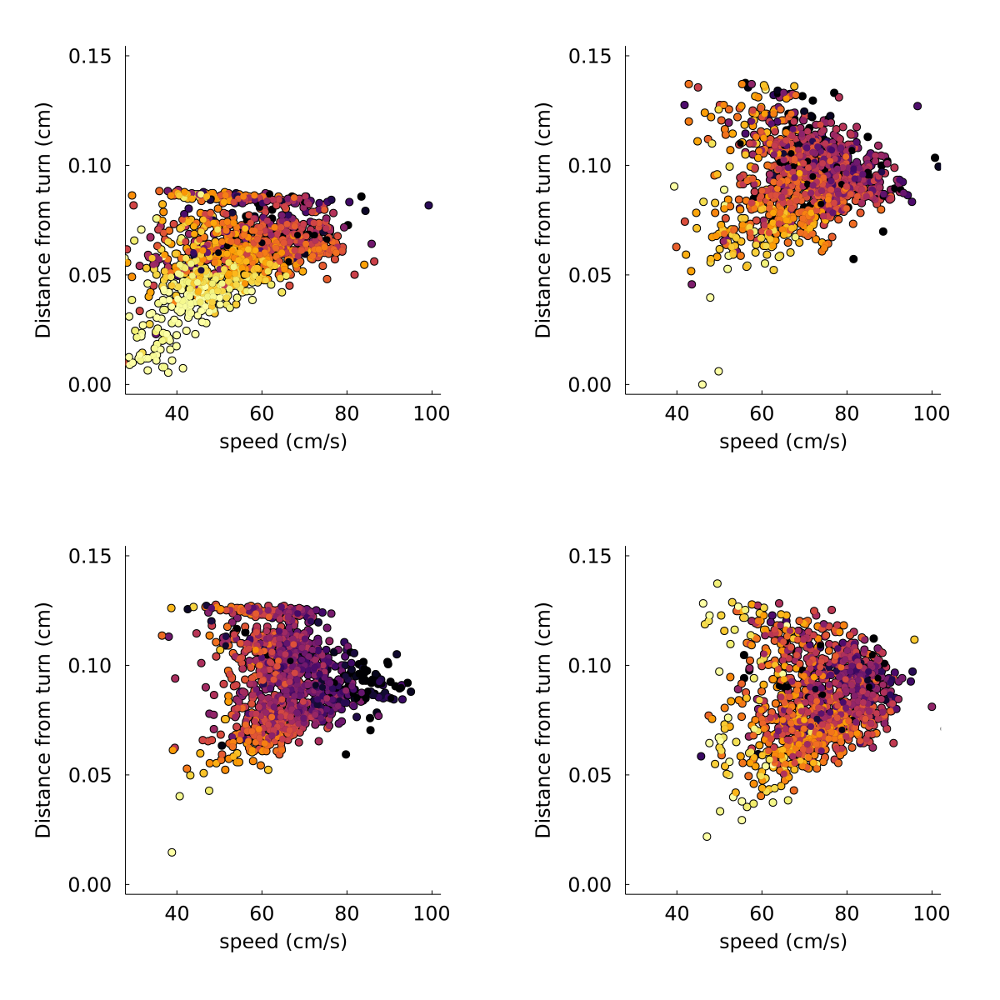

In [214]:
plots = []

# plt = plot(size=(800, 800), xlabel="speed (cm/s)", ylabel="Distance from turn (cm)"; axes_kwargs...)
for roi in 1:4
    roi_bouts = get_roi_bouts(roi, out_bouts)
    slow_kin, turn_kin = get_kinematics_at_slow_turn_onsets(roi_bouts)

    Δspeed = turn_kin.speed - slow_kin.speed
    Δs = roi_limits[roi][3] .- slow_kin.s

    pp = scatter(
        # pp,
        slow_kin.speed, Δs, 
        legend=false, 
        color=:black, alpha=1, ms=6, msw=0, msa=1,
        xlim=[30, 100], ylim=[0, 0.15],
    )

    scatter!(
        pp,
        slow_kin.speed, Δs, 
        marker_z=Δspeed,
        legend=false, 
        clims=(-40, 0),
        color=:black, alpha=1, ms=5, msw=0.0, 
        colorbar_title="Δspeed (cm/s)",
        xlabel="speed (cm/s)", ylabel="Distance from turn (cm)"
    )
    push!(plots, pp)
end
# plt
plot(plots..., layout=(2, 2), size=(1200, 1200); axes_kwargs..., axes_fontsize...)
